In [48]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow import keras
import warnings
from IPython.display import Audio
import librosa

warnings.filterwarnings('ignore')

from matplotlib import pyplot as plt

model= keras.models.load_model("separator_model_small.keras")
img_size = 128
dataset = os.listdir("music_dataset_spectro_full_single/train") #use as labels
labels = dataset
print(labels)
sr=22050

['Accordion', 'Acoustic_Guitar', 'Banjo', 'Bass_Guitar', 'Clarinet', 'cowbell', 'Dobro', 'Drum_set', 'Electric_Guitar', 'flute', 'Harmonium', 'Horn', 'Keyboard', 'Mandolin', 'Organ', 'Piano', 'Saxophone', 'Shakers', 'Tambourine', 'Trombone', 'Trumpet', 'Ukulele', 'vibraphone', 'Violin']


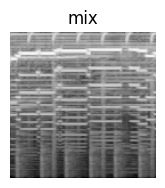

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


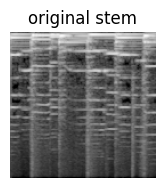

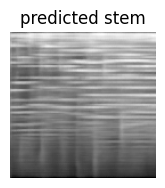

with phase prediction


with original phase


In [51]:
#separte an accordian is combined with banjo ,clairnet and dobro

img = cv2.imread("music_separation_dataset_small/test/full_mix/842_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/842_Accordion.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/842.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Accordion/139.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/842.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))


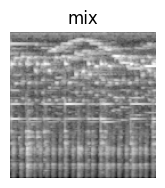

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


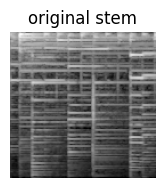

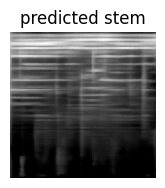

with phase prediction


with original phase


In [52]:
#separte an acoustic guitar is combined with bass ,cowbell and drumset

img = cv2.imread("music_separation_dataset_small/test/full_mix/843_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/843_Acoustic_Guitar.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/843.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Acoustic_Guitar/93.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/843.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

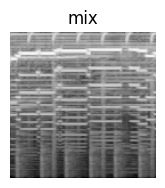

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


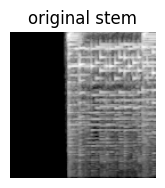

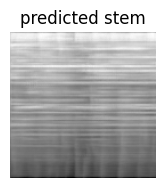

with phase prediction


with original phase


In [ ]:
#separte an banjo is combined with accodian ,clairnet and dobro

img = cv2.imread("music_separation_dataset_small/test/full_mix/842_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/842_Banjo.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/842.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Banjo/93.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/842.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))


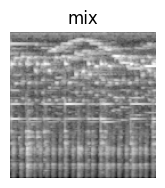

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


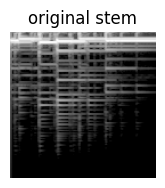

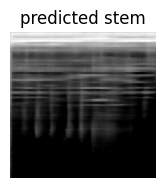

with phase prediction


with original phase


In [ ]:
#separte an bass guitar is combined with acoustic ,cowbell and drumset

img = cv2.imread("music_separation_dataset_small/test/full_mix/843_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/843_Bass_Guitar.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/843.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Bass_Guitar/93.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/843.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

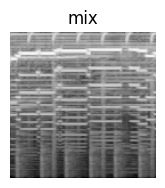

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


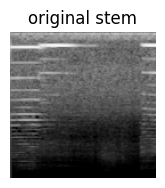

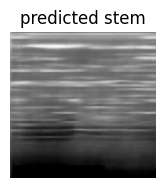

with phase prediction


with original phase


In [58]:
#separating a clarinet from banjo,accordian and dobro
img = cv2.imread("music_separation_dataset_small/test/full_mix/842_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/842_Clarinet.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/842.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Clarinet/93.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/842.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))


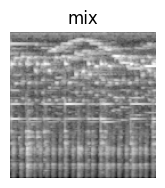

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


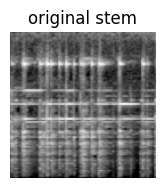

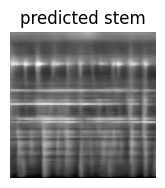

with phase prediction


with original phase


In [59]:
#separte an cowbell is combined with acoustic ,cowbell and bass_guitar

img = cv2.imread("music_separation_dataset_small/test/full_mix/843_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/843_cowbell.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/843.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/cowbell/94.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/843.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

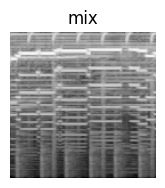

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


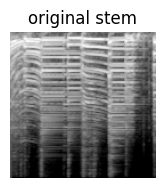

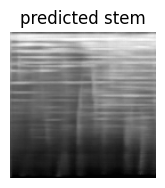

with phase prediction


with original phase


In [ ]:
#separating a dobro from banjo,accordian and clarinet
img = cv2.imread("music_separation_dataset_small/test/full_mix/842_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/842_Dobro.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/842.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Dobro/93.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/842.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))


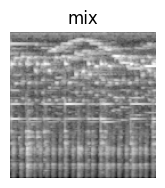

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


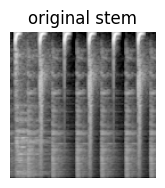

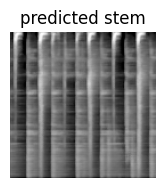

with phase prediction


with original phase


In [ ]:
#separte a drumset is combined with acoustic guitar ,cowbell and bass guitar

img = cv2.imread("music_separation_dataset_small/test/full_mix/843_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/843_drum_set.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/843.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/drum_set/93.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/843.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

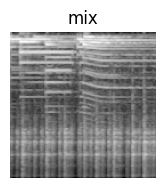

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


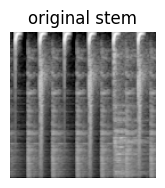

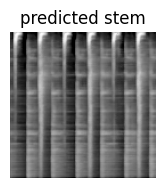

with phase prediction


with original phase


In [ ]:
#separte a drumset from horn, piano,and bass

img = cv2.imread("music_separation_dataset_small/test/full_mix/857_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/857_drum_set.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/857.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/drum_set/94.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/857.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

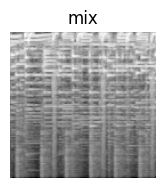

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


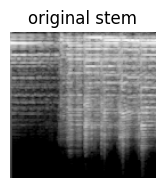

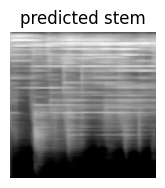

with phase prediction


with original phase


In [125]:
#separte a eletric guitar from flute, harmonium,and horn

img = cv2.imread("music_separation_dataset_small/test/full_mix/838_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/838_Electric_Guitar.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/838.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Electric_Guitar/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/838.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

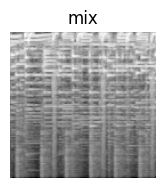

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


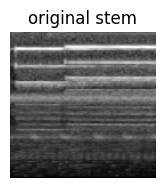

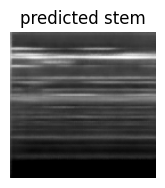

with phase prediction


with original phase


In [124]:
#separte a flute from eletric guitar, harmonium,and horn

img = cv2.imread("music_separation_dataset_small/test/full_mix/838_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/838_flute.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/838.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/flute/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/838.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

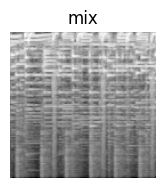

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


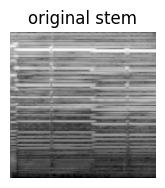

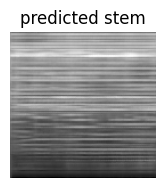

with phase prediction


with original phase


In [123]:
#separte a harmonium from eletric guitar, flute,and horn

img = cv2.imread("music_separation_dataset_small/test/full_mix/838_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/838_Harmonium.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/838.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Harmonium/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/838.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

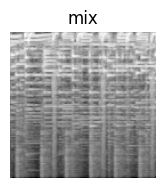

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


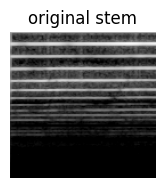

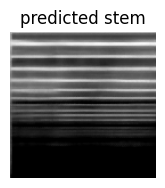

with phase prediction


with original phase


In [122]:
#separte a horn from eletric guitar, flute,and harmonium

img = cv2.imread("music_separation_dataset_small/test/full_mix/838_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/838_Horn.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/838.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Horn/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/838.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

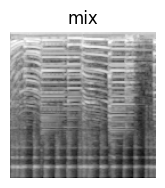

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


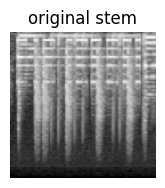

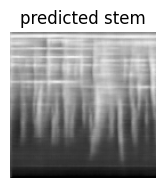

with phase prediction


with original phase


In [121]:
#separte a keyboard from mandolin, organ,and Piano

img = cv2.imread("music_separation_dataset_small/test/full_mix/839_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/839_keyboard.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/839.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,0,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/keyboard/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/839.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

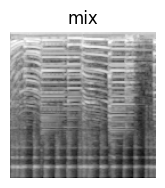

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


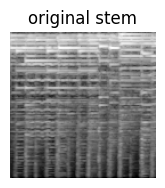

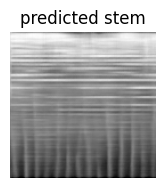

with phase prediction


with original phase


In [ ]:
#separte a mandolin from keyboard, organ,and Piano

img = cv2.imread("music_separation_dataset_small/test/full_mix/839_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/839_Mandolin.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/839.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,1,0,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Mandolin/97.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/839.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

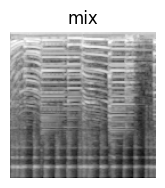

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


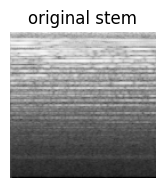

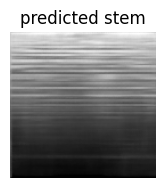

with phase prediction


with original phase


In [120]:
#separte a mandolin from keyboard, organ,and Piano

img = cv2.imread("music_separation_dataset_small/test/full_mix/839_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/839_Organ.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/839.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,1,0,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Organ/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/839.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

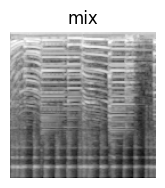

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


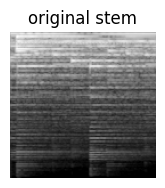

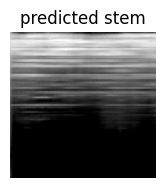

with phase prediction


with original phase


In [119]:
#separte a piano from keyboard, organ,and mandolin

img = cv2.imread("music_separation_dataset_small/test/full_mix/839_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/839_Piano.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/839.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,1,0,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Piano/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/839.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

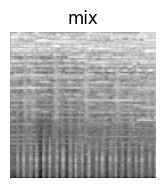

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


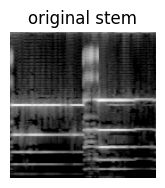

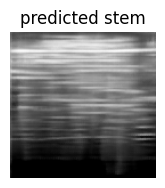

with phase prediction


with original phase


In [118]:
#separte a saxophone from shakers, tambourine,and trombone

img = cv2.imread("music_separation_dataset_small/test/full_mix/840_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/840_Saxophone.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/840.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,1,0,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Saxophone/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/840.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

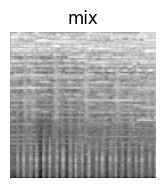

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


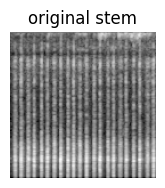

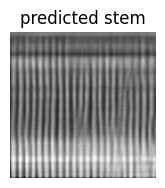

with phase prediction


with original phase


In [117]:
#separte a shakers from saxophone, tambourine,and trombone

img = cv2.imread("music_separation_dataset_small/test/full_mix/840_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/840_Shakers.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/840.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,1,0,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Shakers/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/840.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

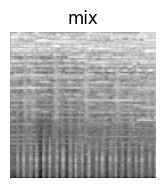

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


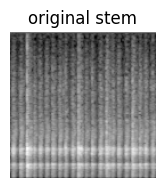

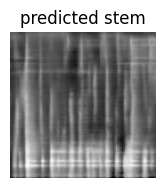

with phase prediction


with original phase


In [115]:
#separte a tambourine from saxophone, shakers,and trombone

img = cv2.imread("music_separation_dataset_small/test/full_mix/840_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/840_Tambourine.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/840.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,1,0,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Tambourine/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/840.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

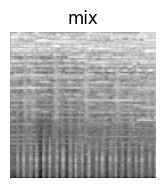

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


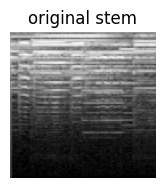

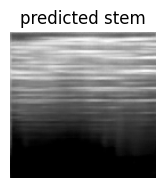

with phase prediction


with original phase


In [116]:
#separte a trombone from saxophone, shakers,and tambourine

img = cv2.imread("music_separation_dataset_small/test/full_mix/840_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/840_Trombone.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/840.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,1,0,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Trombone/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/840.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

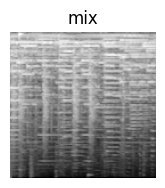

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


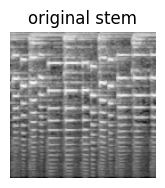

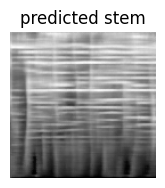

with phase prediction


with original phase


In [101]:
#separte a trumpet from ukuele, vibraphone,and violin

img = cv2.imread("music_separation_dataset_small/test/full_mix/841_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/841_Trumpet.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/841.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,1,0,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Trumpet/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/841.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

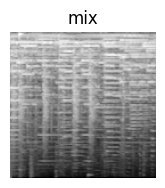

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


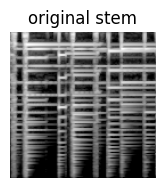

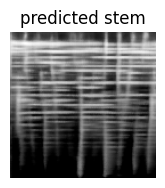

with phase prediction


with original phase


In [95]:
#separte a trumpet from ukuele, vibraphone,and violin

img = cv2.imread("music_separation_dataset_small/test/full_mix/841_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/841_Ukulele.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/841.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,1,0,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/Ukulele/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/841.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

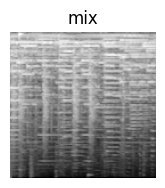

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


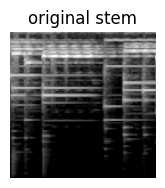

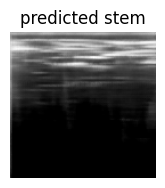

with phase prediction


with original phase


In [97]:
#separte a vibraphone from ukuele, trumpet,and violin

img = cv2.imread("music_separation_dataset_small/test/full_mix/841_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/841_vibraphone.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/841.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,1,0]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/vibraphone/95.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/841.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))

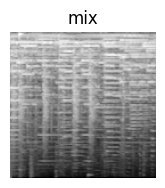

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


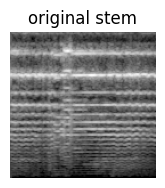

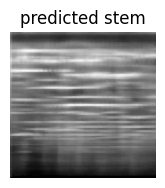

with phase prediction


with original phase


In [100]:
#separte a violin from ukuele, trumpet,and vibraphone

img = cv2.imread("music_separation_dataset_small/test/full_mix/841_mix.png",0)
img1 = cv2.imread("music_separation_dataset_small/test/stems/841_Violin.png",0)
img=img[:128,:128]


plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title("mix")
plt.axis('off')
plt.show()
display(Audio('audio_separator_dataset/mix/841.wav', autoplay=False,rate =sr))


img1=img1[:128,:128]

img= np.reshape(img,(-1, 128, 128, 1))
img=img/255
acoustic = np.array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0,0,0,0,0,0,0,0,0,1]])

predimg= np.squeeze(model.predict([img,acoustic]))

prediction= predimg*255


plt.subplot(1,3,1)
plt.imshow(img1,cmap='gray')
plt.title("original stem")
plt.axis('off')
plt.show()
display(Audio('music_dataset/violin/92.wav', autoplay=False,rate =sr))

plt.subplot(1,3,1)
plt.imshow(prediction,cmap='gray')
plt.title("predicted stem")
plt.axis('off')
plt.show()

#93
to_db = (prediction.astype(np.float32)/255)*80-80

power = librosa.db_to_power(to_db)

audio = librosa.feature.inverse.mel_to_audio(power,n_fft = 2048, hop_length = 512,n_iter=256,sr=22050)

audio = librosa.util.normalize(audio)

print("with phase prediction")
display(Audio(audio, autoplay=False,rate =sr))

print("with original phase")

freq, sr = librosa.load("audio_separator_dataset/mix/841.wav")

short_time= librosa.stft(freq)

mag,phase = librosa.magphase(short_time)

inverse_mel = librosa.feature.inverse.mel_to_stft(power,sr=sr)

phase = phase[:,:img_size]

short_inverse = inverse_mel * np.exp(1j*phase)

recon = librosa.istft(short_inverse)
recon = librosa.util.normalize(recon)

display(Audio(recon, autoplay=False,rate =sr))